# 0. Install matplotlib==3.8.0

To do this assignment, you need to use the `matplotlib` library version `3.8.0`. Run the command `pip install matplotlib==3.8.0` below, and follow the prompt to restart the session. You can safely ignore the `ERROR` returned by the `pip` command.

In [1]:
pip install matplotlib==3.8.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 30.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.0
    Uninstalling matplotlib-3.10.0:
      Successfully uninstalled matplotlib-3.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
pytensor 2.35.1 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
jax 0.7.2 requires numpy>=2.0, but you have numpy 

# 1. Running Holefill.py

First copy the contents of hw3 into the project directory. In order to run the Holefill.py from Jupyter notebook, execute the command below. It will print two figures inline: one containing the original image and the other showing the region to be filled and the texture region. You will be asked, "Are you happy with this choice of fillRegion and textureIm?". You should type "Yes" to proceeed. Finally, the script will print a figure of the image with the texture filled in. As this skeleton program is missing some critical routines, the texture will initially be filled in as all black.

**Note.** If you do not see a text box to type `Yes` to the question `Are you happy with this choice of fillRegion and textureIm?` while running the `%run Holefill.py` command below, you can interrupt the execution and run the command again. This trick usually works. If you still cannot see the text box after trying that, you can replace the `%run Holefill.py` command with the contents of `Holefill.py` and execute the code directly.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
from google.colab import files
uploaded = files.upload()

Saving fill_region.pkl to fill_region (1).pkl
Saving texture_region.pkl to texture_region (1).pkl


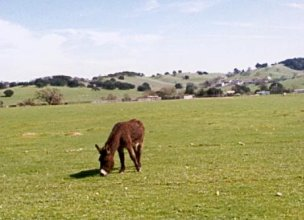

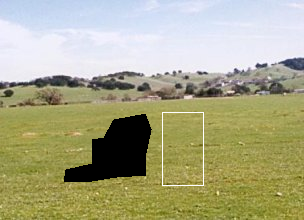

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  3473
Number of pixels remaining =  1178
Number of pixels remaining =  108


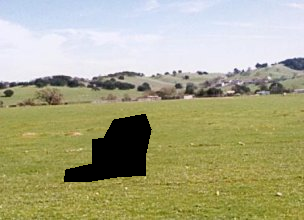

In [6]:
%run Holefill.py

# 2. Modify Holefill.py

You need to modify the `ComputeSSD` function in `Holefill.py`, whose purpose is to compute the sum squared difference (SSD) between an image patch and the texture image for each possible location of the patch within the texture image.  This function must ignore empty pixels that have a value of `1` in the given mask image. <u>Please follow the hints provided on the assignment webpage for the complete instructions.</u>

 For next part, you need to modify the function `CopyPatch` in the 'Holefill.py' that takes the SSD image created above and chooses randomly amongst the best matching patches to decide which patch to paste into the texture image at that point. Remember again that you should only copy pixel values into the hole section of the image. Existing pixel values should not be overwritten. Skeleton code for `CopyPatch` is provided in `Holefill.py`, along with comments explaining the arguments.

 Try running the 'Holefill.py' again with the modified code to see if hole-filling part is correctly implemented.

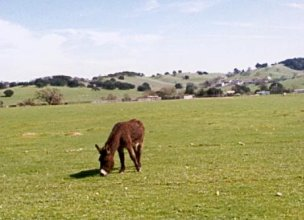

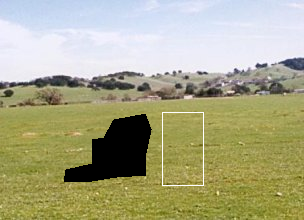

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  3473
Number of pixels remaining =  1122
Number of pixels remaining =  56


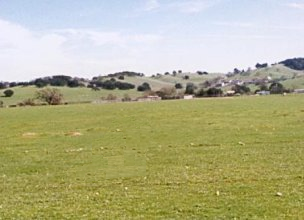

In [58]:
%run Holefill.py

# 3. Custom fill and texture Regions

Now, you can select your own regions to fill or texture selection by running the `polyselect.py` file. To make interactive inline operations compatible with Jupyter Notebook, you need to first install `ipympl` using `pip install ipympl`. Then you need to enable the inline interactive operation by `%matplotlib ipympl`. Finally execute the `polyselect.py` file using `%run polyselect.py`.

In [8]:
pip install ipympl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 515.8/515.8 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.9 MB/s eta 0:00:00


In [9]:
%matplotlib ipympl

Now run the polyselect.py file. To draw a polygon you need to select each successive vertex with a  left-click. Simply right-click anywhere in the image to save the polygon. When you run the 'polyselect.py' file you will be prompted whether you want to draw polygon for fill region (type '0') or texture region (type '1'). Depending on what you choose the polyon will be saved in either 'fill_region.pkl' or 'texture_region.pkl' To run the polyselect execute the following:

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 0
Please use your mouse to specify the region that you want for fill_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


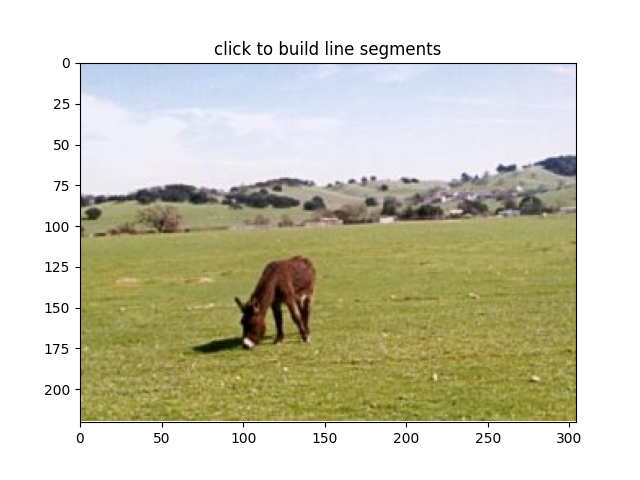

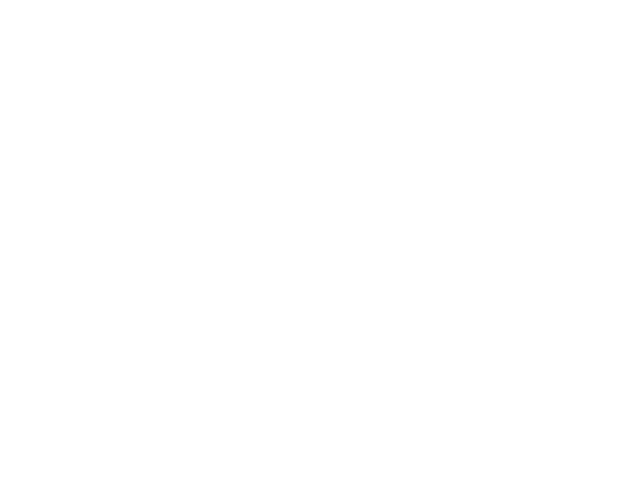

Saved region to fill_region.pkl!


In [59]:
%run polyselect.py

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 1
Note: Code in Holefill.py forces the texture region to be rectangular
Please use your mouse to specify the region that you want for texture_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


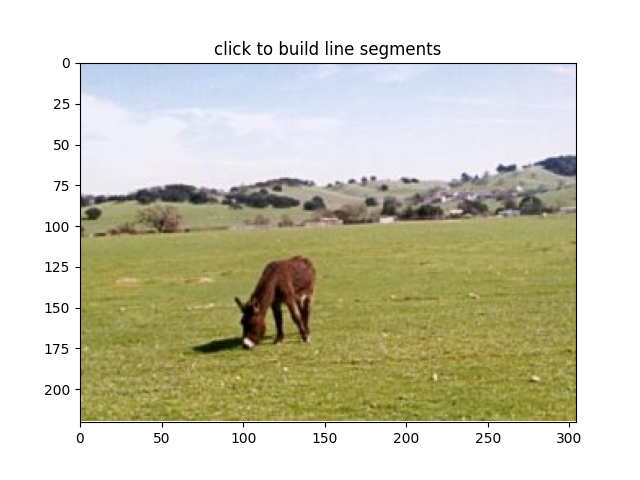

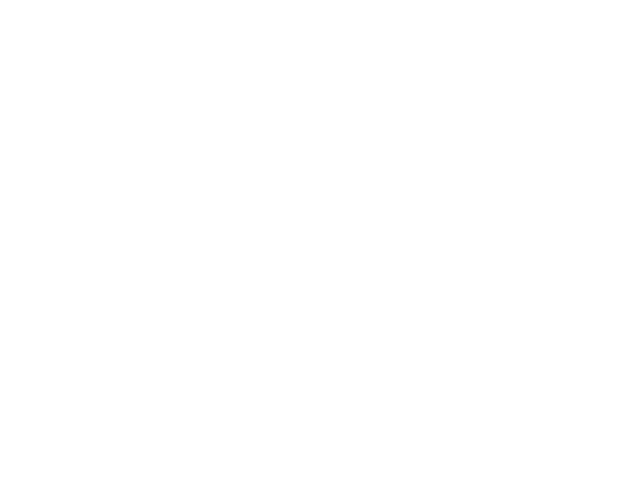

Saved region to texture_region.pkl!


In [60]:
%run polyselect.py

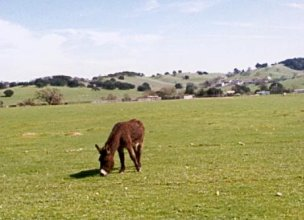

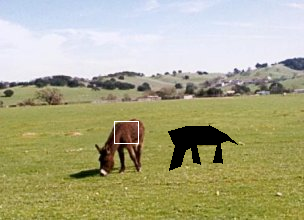

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  1533
Number of pixels remaining =  90


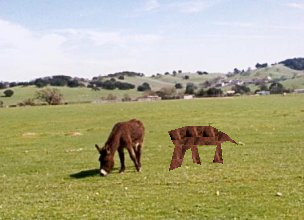

In [62]:
%run Holefill.py

In [30]:
# upload different images to try
uploaded = files.upload()
# also update Holefill.py with new filenames

Saving shirt.jpg to shirt (1).jpg
Saving slug.jpg to slug (1).jpg
Saving tattoo.jpg to tattoo (1).jpg


In [33]:
# write quick script to downsample photos since they are very large compared to the donkey
from PIL import Image, ImageDraw
from scipy.ndimage import gaussian_filter

def downsample(im, filepath):
  # reduces image file so that maximum length in pixel in any dimension is less than 300
  x, y = im.width, im.height
  r, g, b = im.split() # if multi-channel, split channels and filter before reassmbeling
  sigma=2
  r, g, b = Image.fromarray(gaussian_filter(r, sigma)), Image.fromarray(gaussian_filter(g, sigma)), Image.fromarray(gaussian_filter(b, sigma))
  im2 = Image.merge('RGB', (r, g, b))
  imnew = im2.resize((int(x*0.5), int(y*0.5)), Image.BICUBIC)
  print(imnew.width, imnew.height)
  max_dim = 500
  if imnew.width > max_dim or imnew.height > max_dim:
    return downsample(imnew, filepath)
  else:
    imnew.convert('RGB').save(f'new_{filepath}')

1736 1577
868 788
434 394


In [42]:
filepath='slug.jpg'
im = Image.open(filepath).convert('RGB')
downsample(im, filepath)

1736 1577
868 788
434 394


In [40]:
filepath='tattoo.jpg'
im = Image.open(filepath).convert('RGB')
downsample(im, filepath)

540 938
270 469


In [41]:
filepath='shirt.jpg'
im = Image.open(filepath).convert('RGB')
downsample(im, filepath)

799 1064
399 532
199 266


**Picture 1: Slug**

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 0
Please use your mouse to specify the region that you want for fill_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


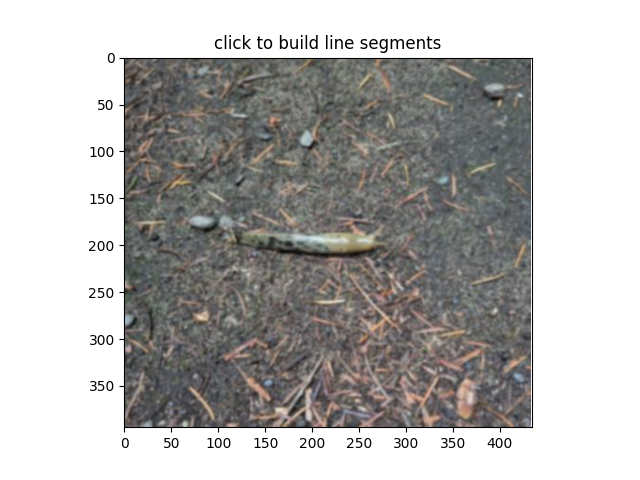

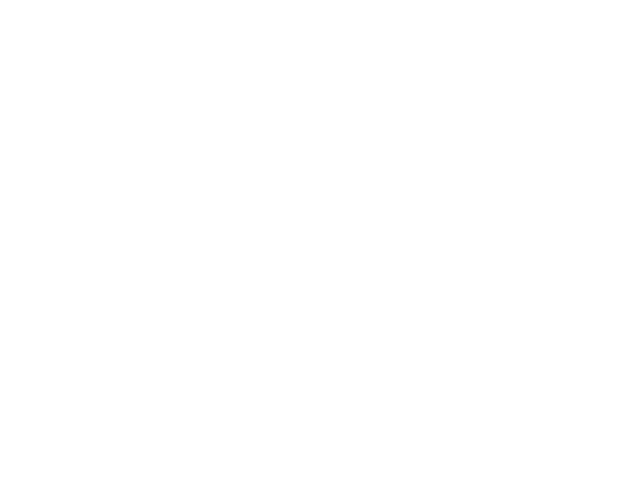

Saved region to fill_region.pkl!


In [64]:
%run polyselect.py # region to be filled

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 1
Note: Code in Holefill.py forces the texture region to be rectangular
Please use your mouse to specify the region that you want for texture_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


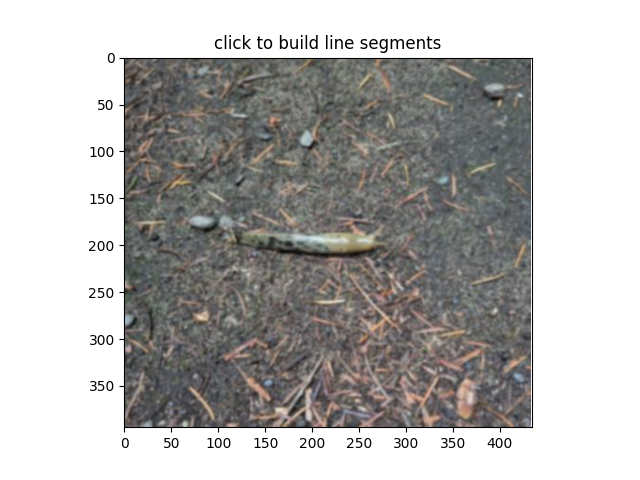

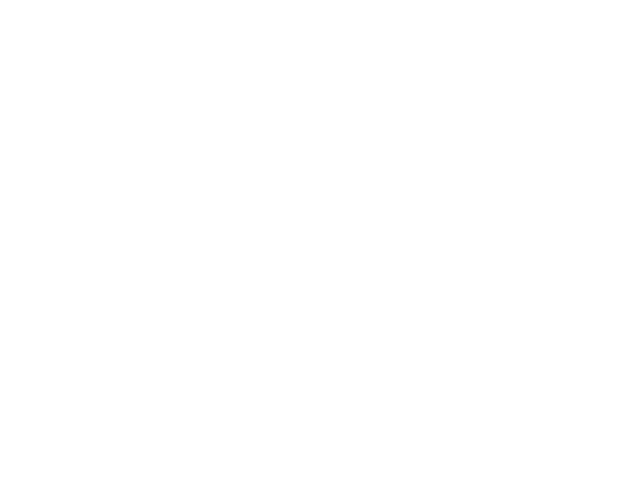

Saved region to texture_region.pkl!


In [65]:
%run polyselect.py # texture patch

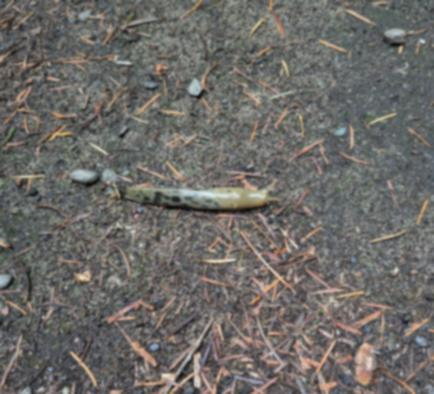

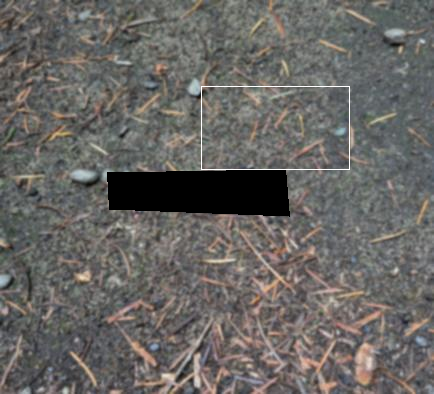

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  7560
Number of pixels remaining =  3145
Number of pixels remaining =  12


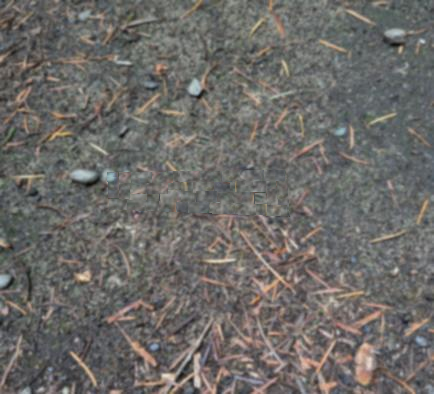

In [67]:
%run Holefill.py

These results are fairly good. While there is some clipping of the large-scale pine needle pattern, the dirt texture is similar to the rest of the image in terms of brightness and variation.

**Picture 2: Tattoo**

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 0
Please use your mouse to specify the region that you want for fill_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


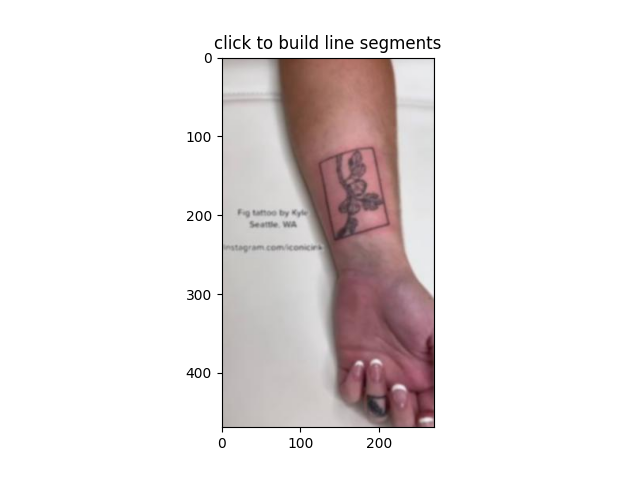

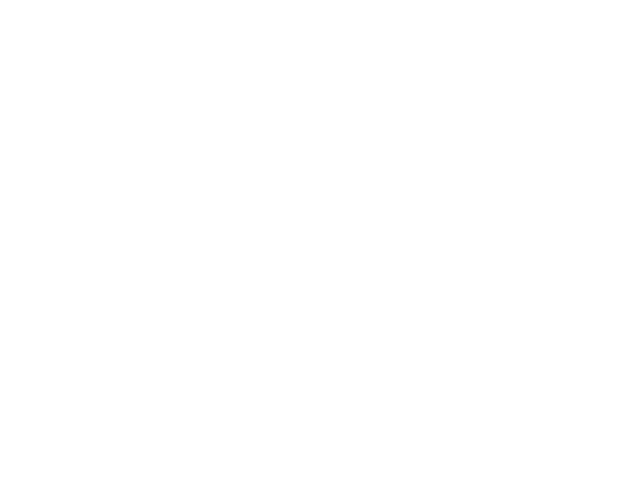

Saved region to fill_region.pkl!


In [111]:
%run polyselect.py # region to be filled

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 1
Note: Code in Holefill.py forces the texture region to be rectangular
Please use your mouse to specify the region that you want for texture_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


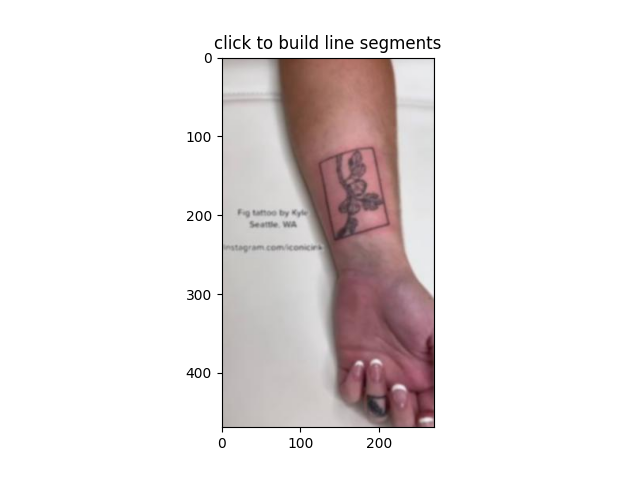

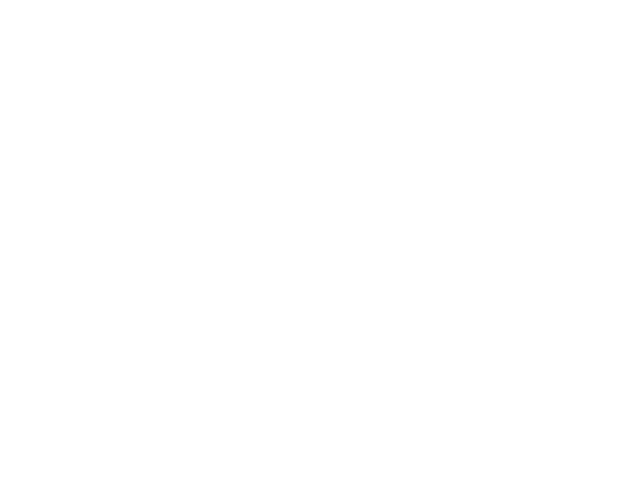

Saved region to texture_region.pkl!


In [112]:
%run polyselect.py # texture patch

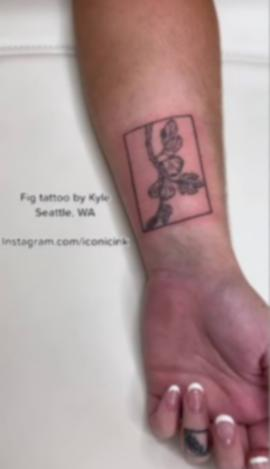

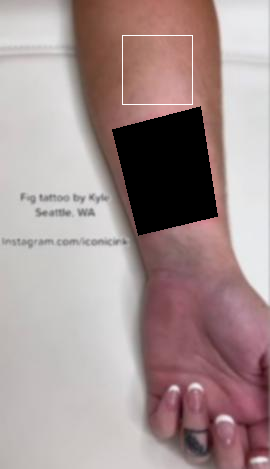

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  9599
Number of pixels remaining =  5594
Number of pixels remaining =  2632
Number of pixels remaining =  700


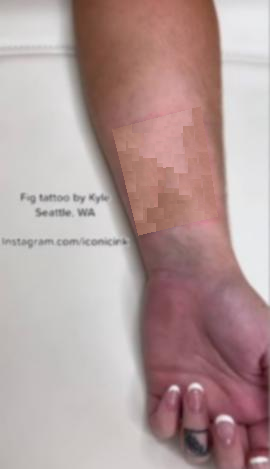

In [119]:
%run Holefill.py

The fill results for the tattoo image are quite poor. This may be due to a few factors. First, the chosen texture patch is not a great match in terms of brightness/illumination to the area to be filled, which is slightly redder and more shadowed. This is shown by the fact that the fill is worst in the bottom left corner of the region, which is darkest. Second, there are some fairly harsh edges between copied patches, indicating that the SSD criteria is perhaps not stringent enough for this image, where the texture being sampled/filled is meant to be quite homogeneous, thus the human eye notices discontinuities very easily. Finally, because there is some difference in brightness in the texture region, a smaller patch size might be more effective to better represent this 'ombre' in the resulting fill.

**Picture 3: Shirt**

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 0
Please use your mouse to specify the region that you want for fill_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


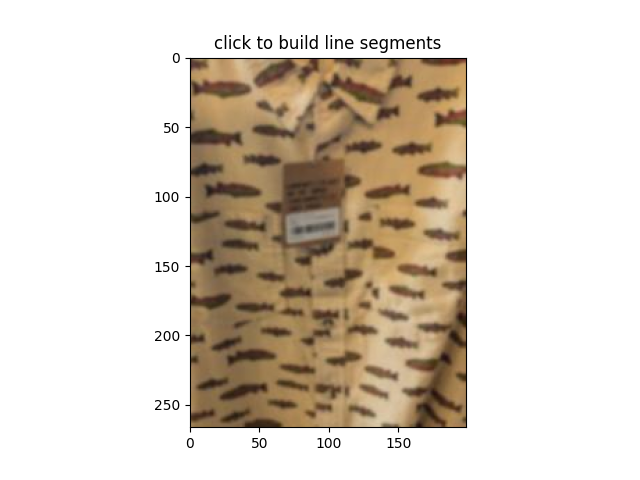

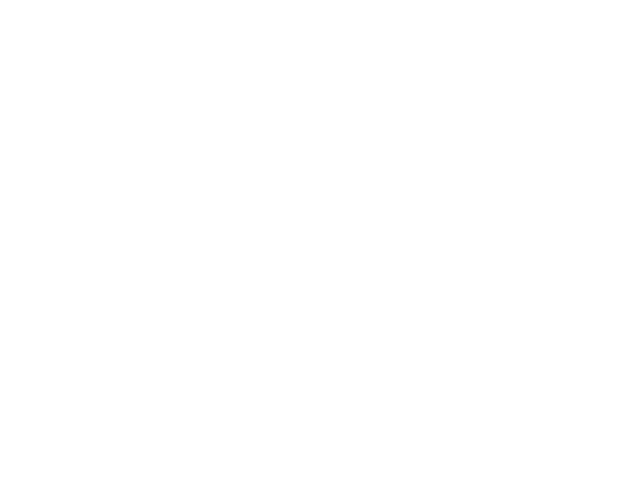

Saved region to fill_region.pkl!


In [73]:
%run polyselect.py # region to be filled

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 1
Note: Code in Holefill.py forces the texture region to be rectangular
Please use your mouse to specify the region that you want for texture_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


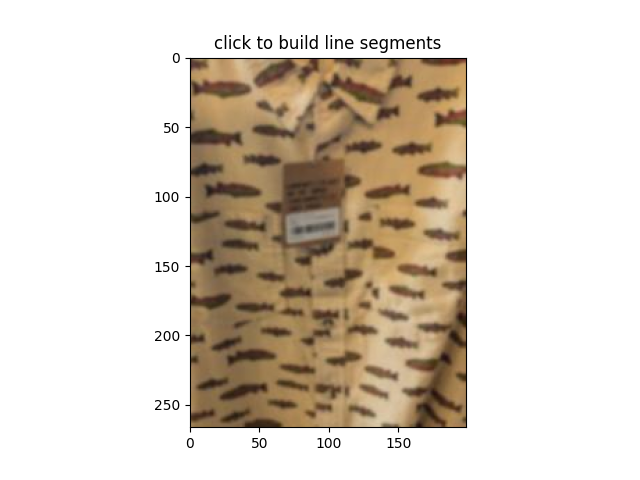

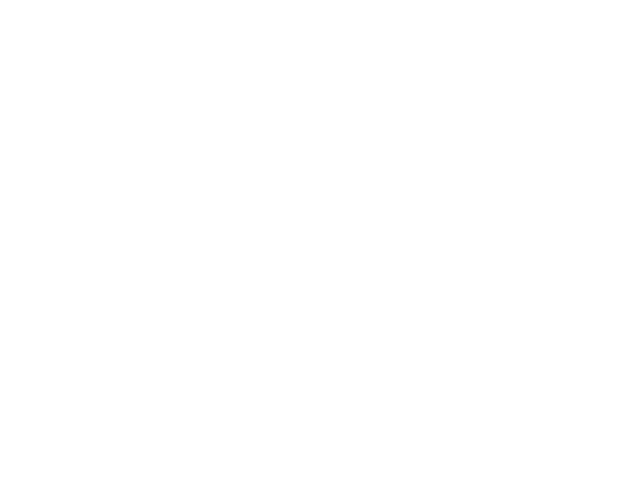

Saved region to texture_region.pkl!


In [74]:
%run polyselect.py # texture patch

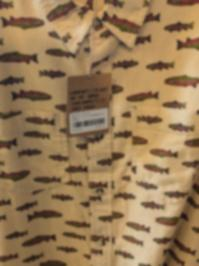

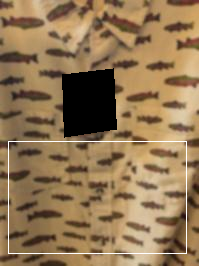

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  3277
Number of pixels remaining =  1229
Number of pixels remaining =  160


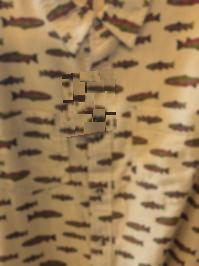

In [75]:
%run Holefill.py

This texture fill is not great either. The patch size appears to be too small to capture the large-scale fish pattern. There are also some differences in brightness/illumination in the texture patch (which is quite wide and thus captures some shadowing from the folds of the fabric), in contrast to the area to be filled which is much narrower.

Experimenting with patch size (using slug)

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 0
Please use your mouse to specify the region that you want for fill_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


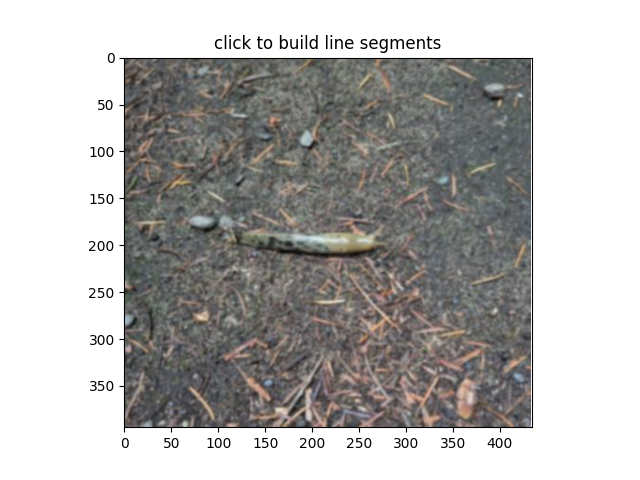

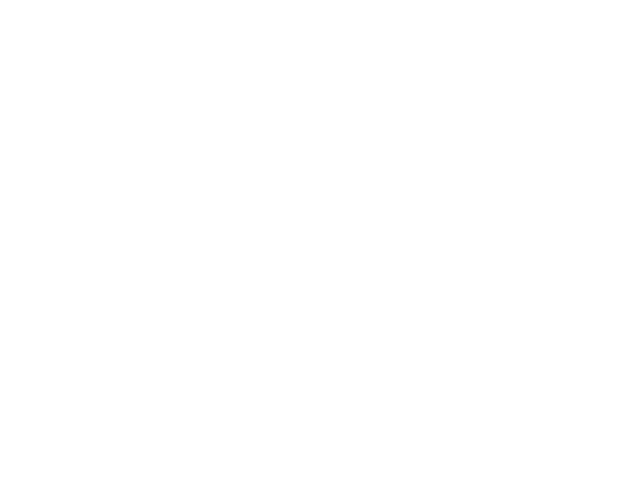

Saved region to fill_region.pkl!


In [77]:
# create suitable fill and texture patches
%run polyselect.py

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 1
Note: Code in Holefill.py forces the texture region to be rectangular
Please use your mouse to specify the region that you want for texture_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


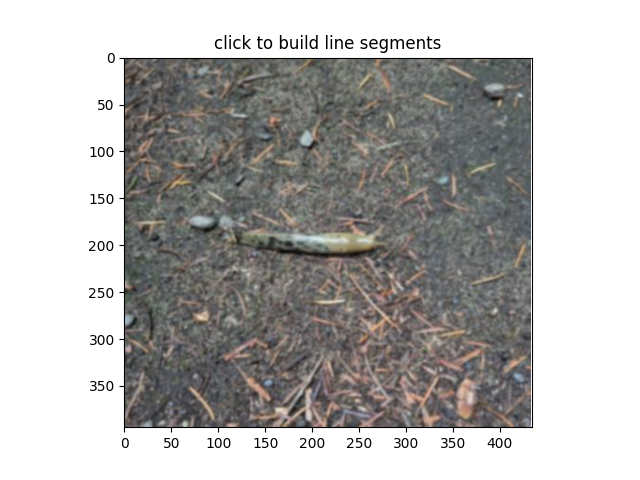

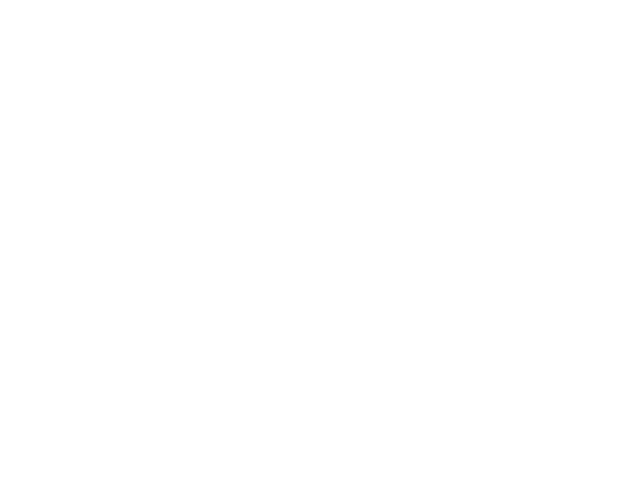

Saved region to texture_region.pkl!


In [78]:
%run polyselect.py

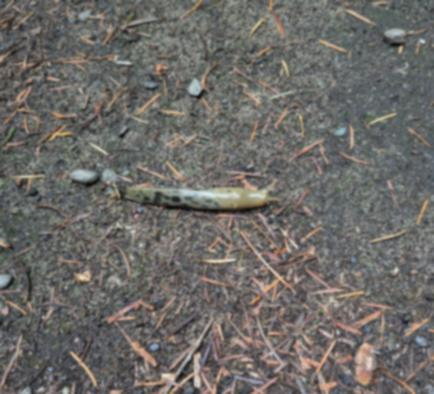

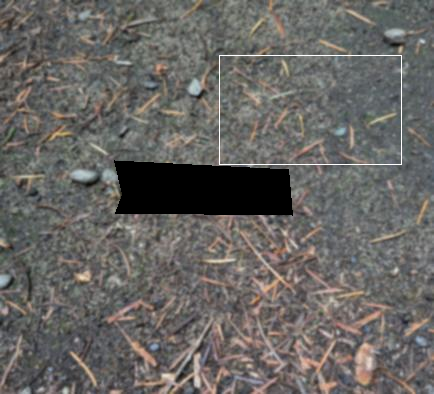

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  8534


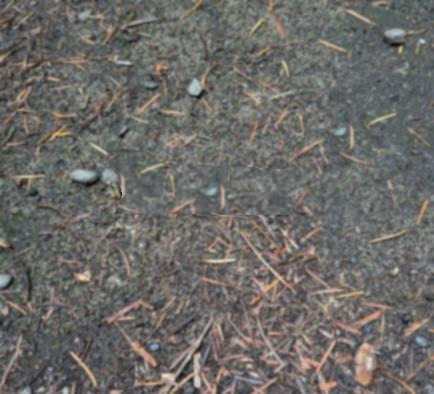

In [81]:
# default = 10
# patchL = 50
%run Holefill.py

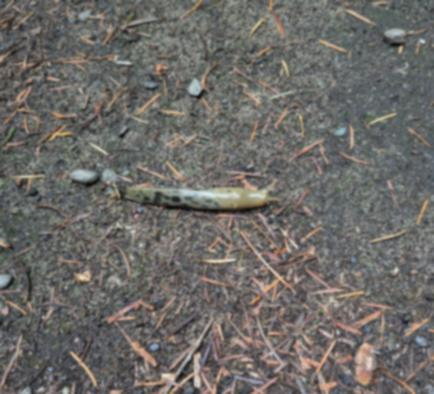

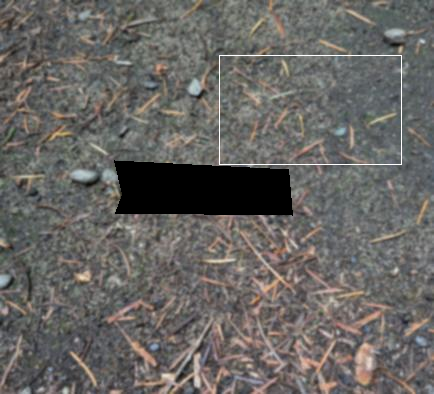

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  8534


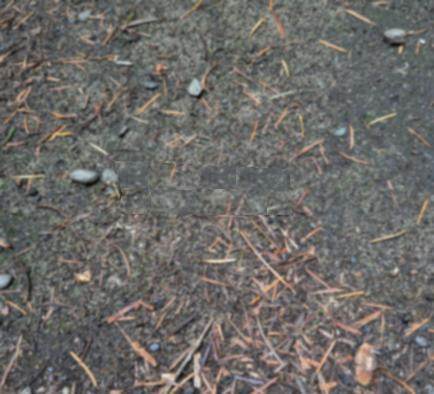

In [80]:
# patchL = 5
%run Holefill.py

In the case of the slug image, the larger patch size of 50 creates a better looking filled imaged because the patch size is on the same size scale as the pine needles in the background, thus they are faithfully copied over. Furthermore, the background of dirt is fairly homogeneous. However, in a version of the image without pine needles, the smaller patch of 5 could be a better option, especially as the smaller patch size can better capture any subtle variations in background lightness/texture, where a larger patch could create harsh edges.

To generalize, when the patch size value is too small, I would expect that larger textures fail to be captured or have harsh discontinuities between subsections of the texture features (ex. pine needles are misaligned at the patch edges). When the patch size is too large, I would expect to possibly notice the stitching between copied patches because the texture is changing too rapidly.

Experimenting with randomness (using t-shirt)

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 0
Please use your mouse to specify the region that you want for fill_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


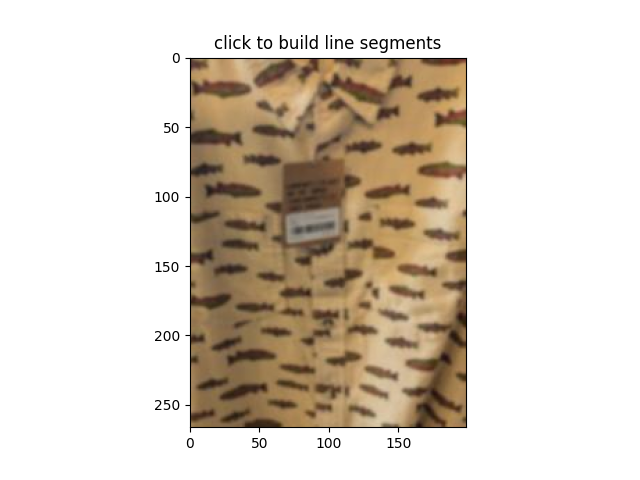

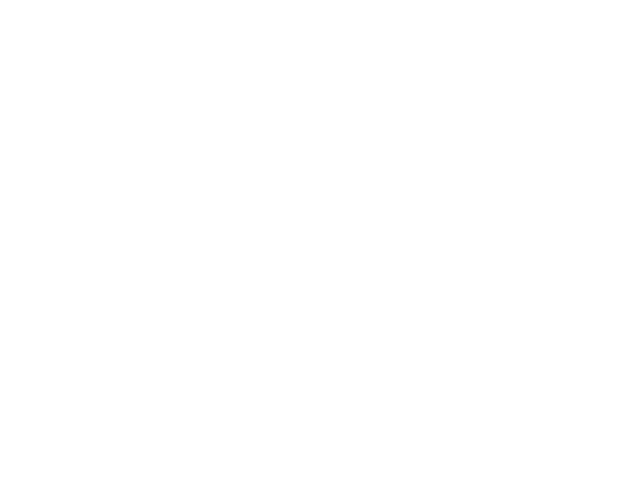

Saved region to fill_region.pkl!


In [94]:
%run polyselect.py

Would you like to select the region to be filled (0) or the sample texture region (1)?
0 or 1: 1
Note: Code in Holefill.py forces the texture region to be rectangular
Please use your mouse to specify the region that you want for texture_region.pkl
(Left-click to select each polygon vertex. Right-click to finalize and save the polygon.)


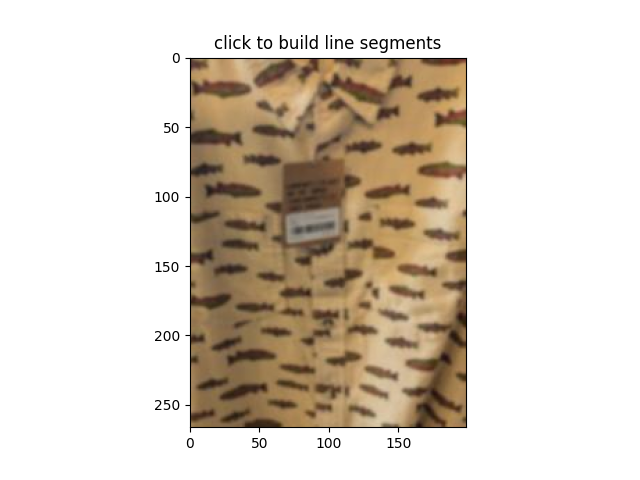

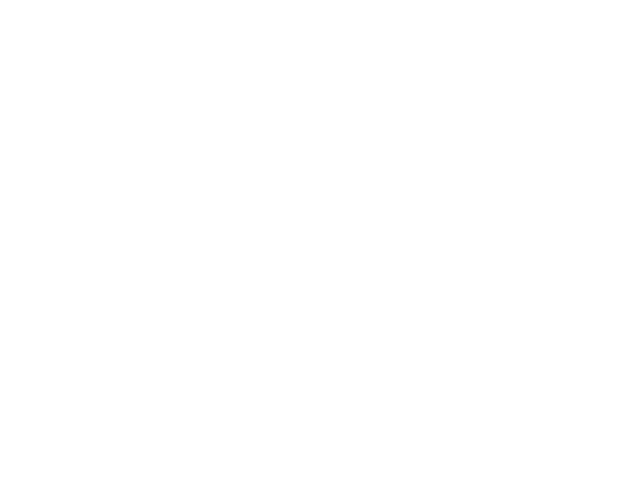

Saved region to texture_region.pkl!


In [97]:
%run polyselect.py

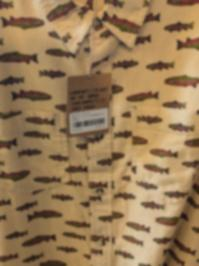

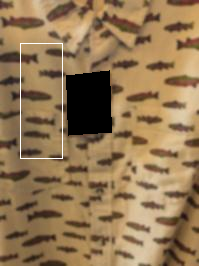

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  2696
Number of pixels remaining =  838


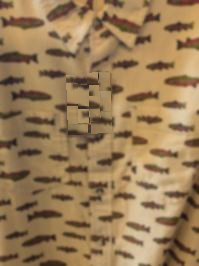

In [104]:
# SD == 30
%run Holefill.py

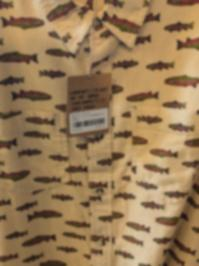

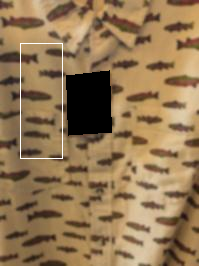

Are you happy with this choice of fillRegion and textureIm?
Yes or No: Yes
Number of pixels remaining =  2696
Number of pixels remaining =  887
Number of pixels remaining =  2


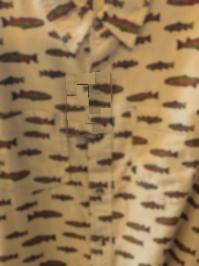

In [107]:
# SD == 0
%run Holefill.py

In the case of SD == 0 (AKA the best matching tile is copied every time), the fill is decent in terms of extending the 'fish' patterns, but there are some harsh discontinuities where the best match in terms of the central fishy pattern is poorly matched at the edges, creating thin brown lines that are not present in the original pattern.

In the case of SD == 30 (AKA the SSD is more randomized prior to patch selection), the fish pattern is not very well preserved in the fill area and there are issues with the brightness of the background across the fill area.

To generalize, when the randomness value (ex. standard deviation) is too small, I would expect that the algorithm chooses patches that are well matched in most pixel regions but risk having small but glaring mismatches in the context of human visual perception. When the randomness value is too high, there is increased chance of poor matches in multiple senses (ex. poor preservation of large-scale texture, brightness inconsistencies), thus the randomness value should ideally be minimized as much as possible, but not so small that it produces distinct artifacts.